In [1]:
from fitburst.pipelines.make_input_file import make_input
from fitburst.pipelines.run_fitburst import run_fitburst
%matplotlib inline
import matplotlib
matplotlib.rcParams.update({'font.size': 14})
from baseband_analysis.core import BBData
import os
import gc
from chime_frb_api import frb_master
import datetime as dt
import numpy as np
import glob
from IPython.display import clear_output
from baseband_analysis.core.signal import tiedbeam_baseband_to_power
gc.collect()

--------------------------------------------------------------------------
[[20389,1],0]: A high-performance Open MPI point-to-point messaging module
was unable to find any relevant network interfaces:

Module: OpenFabrics (openib)
  Host: 1bae6bb3b670

Another transport will be used instead, although this may result in
lower performance.

NOTE: You can disable this warning by setting the MCA parameter
btl_base_warn_component_unused to 0.
--------------------------------------------------------------------------


4

In [2]:
dms_pol = [348.732, 348.791, 348.744, 349.89, 348.68, 349.11, 349.847, 
       349.097, 348.98, 349.27, 349.37, 349.725, 348.840, 348.73,
       349.507, 349.12, 348.955, 348.7917, 348.99, 348.8435, 348.838,
       348.6885, 349.47, 349.542, 348.83, 348.988, 349.60, 348.93,
       348.95, 348.97, 349.38, 349.22, 348.731, 349.062, 349.79,
       349.9, 348.967, 348.862, 348.94, 349.2, 349.05, 349.22]
dms_pol = np.array(dms_pol)
print(dms_pol)

dsamp_low = [32, 32, 1, 16, 512, 512, 256, 16, 32, 256, 256, 64, 64, 128, 
             32, 512, 64, 16, 1024, 128, 64, 32, 1024, 64, 512, 64, 16, 512, 
             512, 1024, 128, 16, 512, 256, 256, 512, 8, 16, 64, 256, 512, 16]

dsamp_low = np.array(dsamp_low)
print(dsamp_low)

[348.732  348.791  348.744  349.89   348.68   349.11   349.847  349.097
 348.98   349.27   349.37   349.725  348.84   348.73   349.507  349.12
 348.955  348.7917 348.99   348.8435 348.838  348.6885 349.47   349.542
 348.83   348.988  349.6    348.93   348.95   348.97   349.38   349.22
 348.731  349.062  349.79   349.9    348.967  348.862  348.94   349.2
 349.05   349.22  ]
[  32   32    1   16  512  512  256   16   32  256  256   64   64  128
   32  512   64   16 1024  128   64   32 1024   64  512   64   16  512
  512 1024  128   16  512  256  256  512    8   16   64  256  512   16]


In [3]:
##### Events published by Ryan #####
events_pola = [23789294, 23891929, 40363753, 40750224, 40750656, 60073678, 65395717,
              65511496, 67522832, 67522901, 69509443, 71665813, 71784400, 
              71784833, 71785167, 73726599, 83984528, 84081108, 92773515, 
              92844954, 135577833, 151677988, 153859596, 154910364, 154913824, 
              155079679, 163181014, 163362088, 163534005, 166812476, 171681248, 
              171855709, 175004577, 175929272, 176060009, 180666196, 180667327, 
              188553320, 194488374, 194488393, 194488454, 195132396, 200973875, 
              203798724, 203935225]
dms_pola = [348.732, 348.791, 348.744, 349.89, 348.813, 348.68, 349.11, 
           350.053, 349.847, 349.097, 348.98, 349.27, 349.37, 
           349.725, 348.840, 348.73, 349.507, 349.46, 348.955, 
           348.792, 350.12, 348.99, 348.8435, 348.838, 348.6885,
           349.47, 349.542, 348.83, 348.988, 349.60, 348.93, 
           348.95, 348.97, 349.38, 348.8165, 348.731, 349.062,
           349.79, 349.9, 348.967, 348.862, 348.94, 349.20, 
           349.05, 348.901]
dsamp_pola = [ 32, 8, 8, 64, 64, 256, 256, 
              256, 256, 64, 128, 256, 128,
              256, 32, 128, 64, 256, 32, 
              8, 256, 256, 64, 256, 128,
              256, 64, 256, 64, 32, 256, 
              128, 256, 256, 1, 64, 64, 
              256, 256, 2, 4, 16, 256, 
              64, 4]
events_pola = np.array(events_pola)
dms_pola = np.array(dms_pola)
dsamp_pola = np.array(dsamp_pola)

print(events_pola.shape, dms_pola.shape, dsamp_pola.shape)

(45,) (45,) (45,)


In [4]:
basepath = '/data/user-data/ksand/R3/fitburst_run_final/'
entries = os.listdir(basepath)
entries.remove('.ipynb_checkpoints')
entries = np.array(entries)
entries = entries.astype(int)
entries = np.sort(entries)
print(entries)
print(entries.shape)

no_fitburst_event = np.setdiff1d(events_pola, entries)
print(no_fitburst_event)

[ 23789294  23891929  40363753  40750224  40750656  60073678  65395717
  65511496  67522832  67522901  69509443  71665813  71784400  71784833
  71785167  73726599  83984528  84081108  92773515  92844954 135577833
 151677988 153859596 154910364 154913824 155079679 163181014 163362088
 163534005 166812476 171681248 171855709 175004577 175929272 176060009
 180666196 180667327 188553320 194488374 194488393 194488454 195132396
 200973875 203798724 203935225]
(45,)
[]


In [4]:
#### Events with no Tria1_Ryan folder ####
event_remove = [23891929, 203798724, 200973875, 194488374, 188553320,
               180667327, 171855709, 67522901, 203935225]
event_remove = np.sort(np.array(event_remove))
print(event_remove)

[ 23891929  67522901 171855709 180667327 188553320 194488374 200973875
 203798724 203935225]


In [4]:
#### Leftover events #####
event_left, indices1, indices2 = np.intersect1d(events_pola, entries, return_indices = True)
print(event_left, indices1)
event_left = np.delete(events_pola, indices1)
dm_left = np.delete(dms_pola, indices1)
dsamp_left = np.delete(dsamp_pola, indices1)

print(event_left, dm_left.shape, dsamp_left.shape)

[ 23789294  23891929  40363753  40750224  65395717  67522832  67522901
  69509443  71665813  71784400  71784833  71785167  73726599  83984528
  84081108  92773515  92844954 135577833 151677988 153859596 154910364
 154913824 155079679 163181014 163362088 163534005 166812476 171681248
 171855709 175004577 175929272 176060009 180666196 180667327 188553320
 194488374 194488393 194488454 200973875 203798724 203935225] [ 0  1  2  3  6  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26
 27 28 29 30 31 32 33 34 35 36 37 38 39 40 42 43 44]
[ 40750656  60073678  65511496 195132396] (4,) (4,)


In [4]:
basepath = '/data/user-data/ksand/R3/fitburst_run/'
entries = os.listdir(basepath)
entries.remove('.ipynb_checkpoints')
entries = np.array(entries)
entries = entries.astype(int)
entries = np.sort(entries)
print(entries)
print(entries.shape)

[ 23789294  23891929  40363753  40750224  60073678  65395717  67522832
  67522901  69509443  71665813  71784400  71784833  71785167  73726599
  83984528  84081108  92773515  92844954 151677988 153859596 154910364
 154913824 155079679 163181014 163362088 163534005 166812476 171681248
 171855709 175004577 175929272 176060009 180666196 180667327 188553320
 194488374 194488393 194488454 195132396 200973875 203798724 203935225]
(42,)


In [4]:
import gc
gc.collect()

42

[2022-10-13 20:55:15,552] INFO Authorization Status: None
[2022-10-13 20:55:15,553] INFO Authorization Method: Tokens
[2022-10-13 20:55:15,645] INFO Authorization Token : Expired
[2022-10-13 20:55:15,646] INFO Reauthorize Method: Tokens


23891929
32


[2022-10-13 20:55:15,802] WARNING It is required that you pass in a value for the "algorithms" argument when calling decode().
[2022-10-13 20:55:15,803] INFO Reauthorize Result: Passed


2018-12-26 03:43:30
/data/chime/baseband/processed/2018/12/26/astro_23891929/singlebeam_23891929.h5
Loading singelebeam file /data/chime/baseband/processed/2018/12/26/astro_23891929/singlebeam_23891929.h5
File loaded
128
Since the DM was already provided get_snr() will run with DM Range as None
While running the first get_snr it will use the DM range as None
Running the first get_snr() at DM  348.791


/data/user-data/ksand/baseband-analysis/baseband_analysis/core/signal.py:112: RuntimeWarning: Mean of empty slice
  if not np.isnan(np.nanmean(power_in[-1], axis=0)).any():
[2022-10-13 20:55:22,270] INFO Applying LTE mask
/data/user-data/ksand/baseband-analysis/baseband_analysis/core/flagging.py:93: RuntimeWarning: Mean of empty slice
  spect = get_spect(np.nanmean(power_beam, axis=-1), thres=thres_mean)
/usr/local/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1671: RuntimeWarning: Degrees of freedom <= 0 for slice.
  keepdims=keepdims)
[2022-10-13 20:55:30,847] INFO Applying LTE mask


(782, 308)
Frequencies minimum and maximum 400.78125 799.609375
Valid channels size 896
Frequency size: 782
Frequency id size: minimum and maximum freq id 782 1 1022
From now on the DM_range for get_snr() will be None


[2022-10-13 20:55:40,005] INFO Applying LTE mask
[2022-10-13 20:55:49,475] INFO Applying LTE mask


<Figure size 432x288 with 0 Axes>

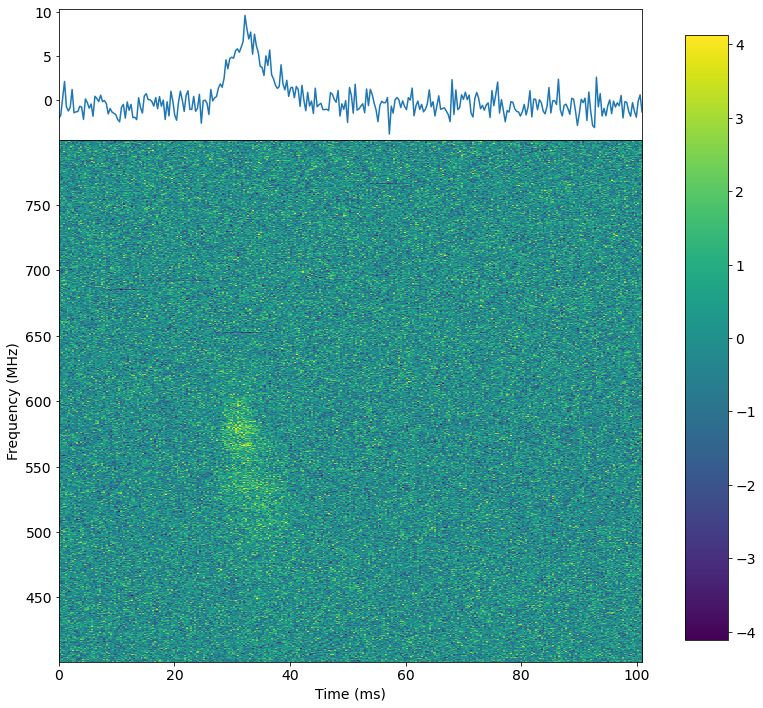

DM value used from now on is 348.791
[ 57 102   4  23 111  75  66]
[0.01867776 0.03342336 0.00131072 0.00753664 0.03637248 0.024576
 0.02162688]
[8.3 1.  1.  0.8 0.7 0.1 0.1]
[7.36677479 0.24456555 0.14186164 0.10922394 0.11390534 1.76065995
 4.00851567]
[ 57 102   4  23 111  75  66]
[0.01867776 0.03342336 0.00131072 0.00753664 0.03637248 0.024576
 0.02162688]
[8.3 1.  1.  0.8 0.7 0.1 0.1]
[7.36677479 0.24456555 0.14186164 0.10922394 0.11390534 1.76065995
 4.00851567]
FRAC: 0.06557377049180328
[57]
[0.01867776]
[8.3]
[7.36677479]


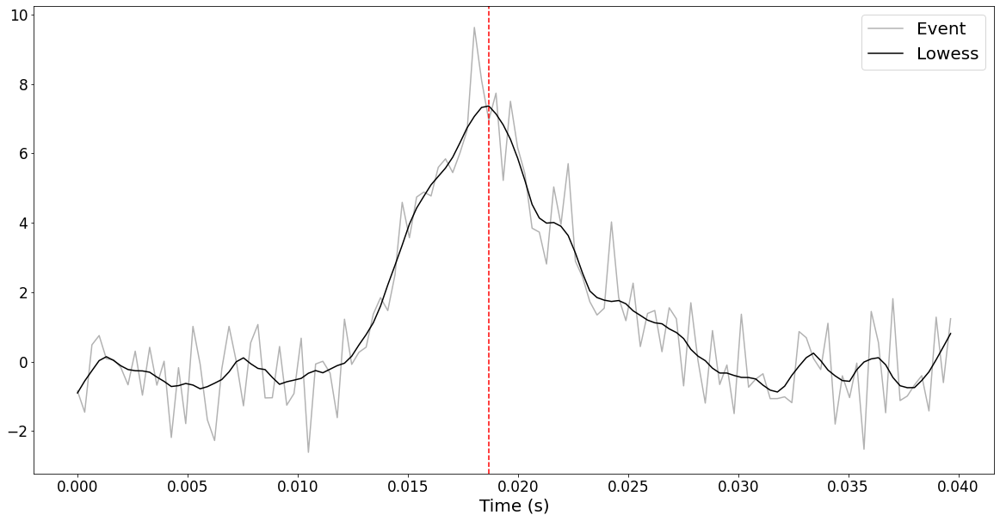

<Figure size 432x288 with 0 Axes>

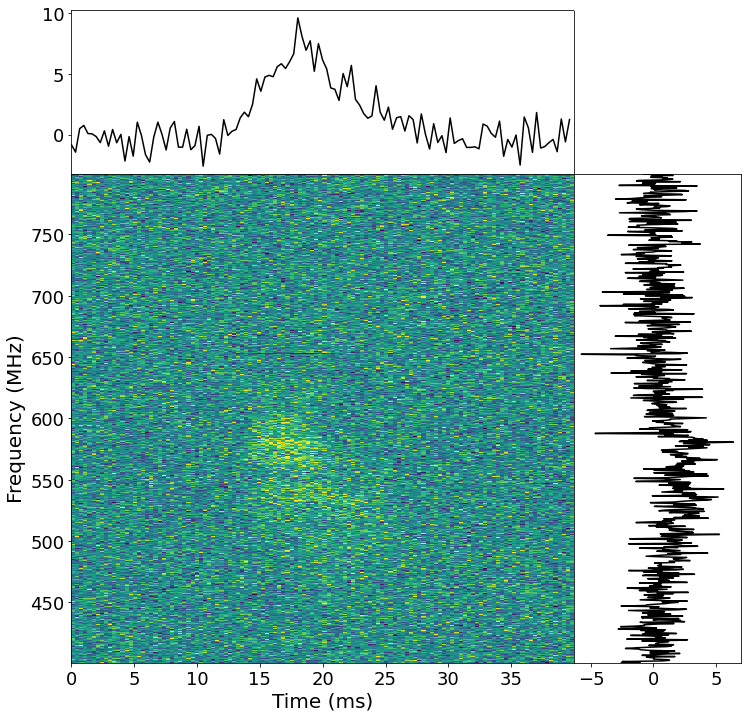

<Figure size 432x288 with 0 Axes>

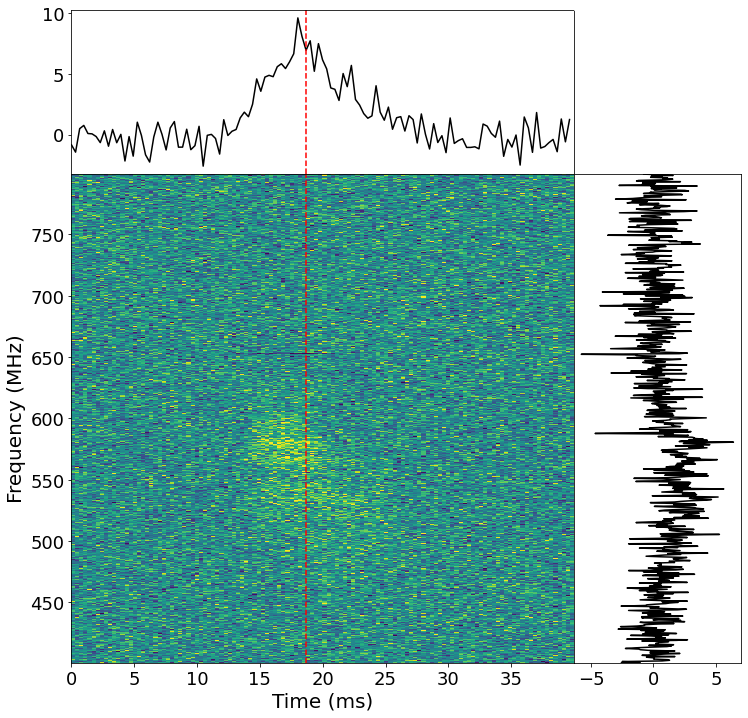

Starting MCMC fit
3  {}
[0.01867776]
[0.008192]
[0.008192]
[0, 0.008192000000000001, 0, 0] [0.018932193750000003, 0.01867776, 0.0019660800000000003, 0.0039321600000000005] [inf, 0.01867776, inf, inf]


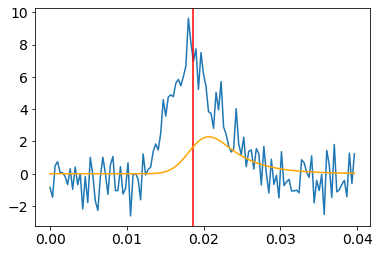

Curve_fit params: [0.05566347 0.0164103  0.00216749 0.00286898]
MEAN [0.0164103]
Reduced Chi Squared for Event 23891929 is 1.188


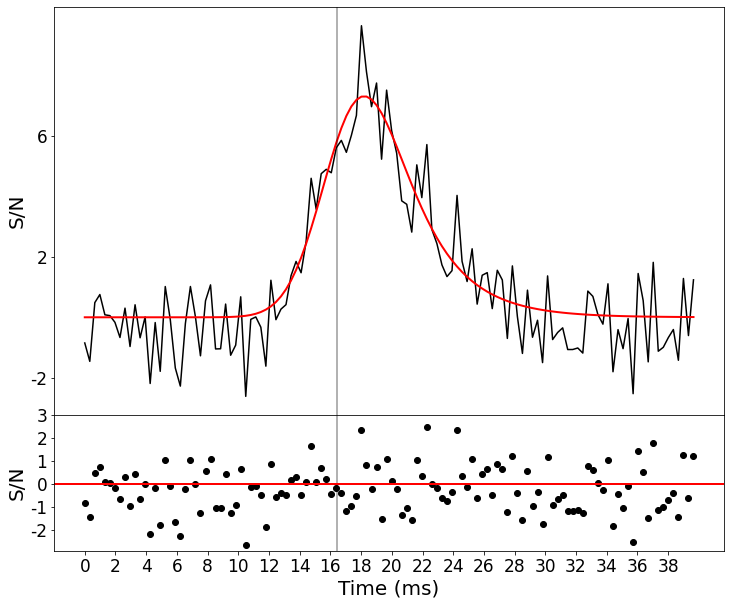

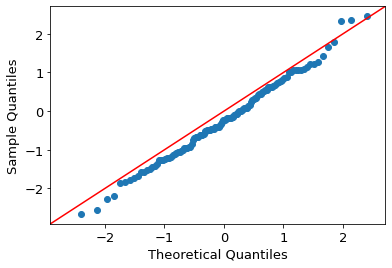

  1%|█                                                                                                                    | 92/10000 [00:00<00:58, 168.48it/s]/usr/local/lib/python3.7/site-packages/fitburst/routines/profile.py:214: RuntimeWarning: overflow encountered in exp
  I = lam/2*np.exp(lam/2*(2*mu + lam*sigma**2 - 2*x))
/usr/local/lib/python3.7/site-packages/fitburst/routines/profile.py:214: RuntimeWarning: overflow encountered in multiply
  I = lam/2*np.exp(lam/2*(2*mu + lam*sigma**2 - 2*x))
/usr/local/lib/python3.7/site-packages/fitburst/routines/profile.py:216: RuntimeWarning: invalid value encountered in multiply
  return I * II
  7%|███████▋                                                                                                            | 663/10000 [00:04<00:55, 167.26it/s]/usr/local/lib/python3.7/site-packages/fitburst/routines/profile.py:214: RuntimeWarning: overflow encountered in exp
  I = lam/2*np.exp(lam/2*(2*mu + lam*sigma**2 - 2*x))
/usr/local/lib/python3.

[45.0930327  46.17839324 45.46157188 46.27952594]


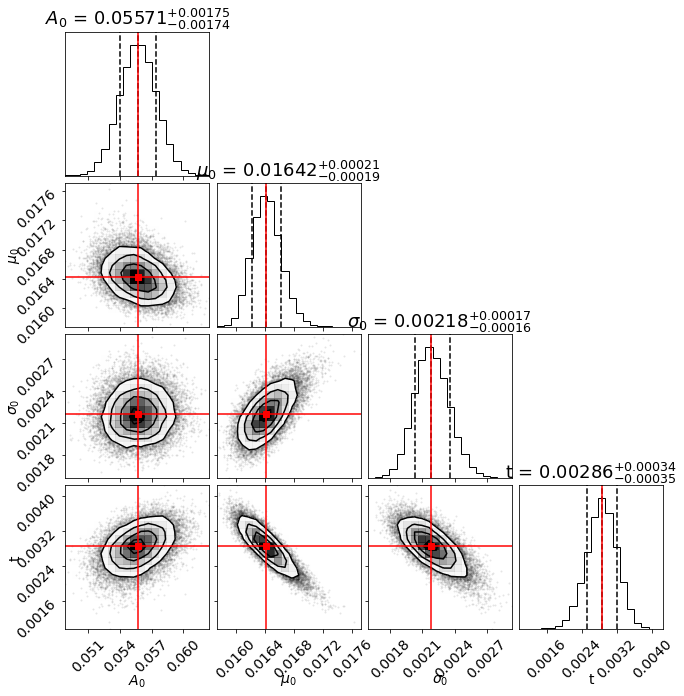

MEAN [0.01642011]
Reduced Chi Squared for Event 23891929 is 1.189


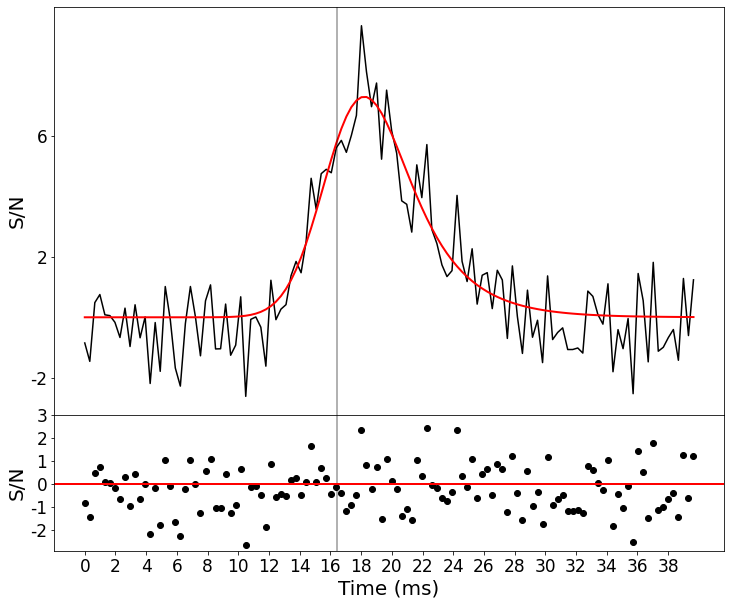

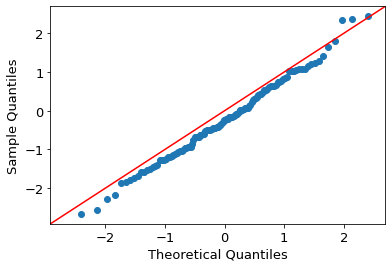

/usr/local/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3441: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/usr/local/lib/python3.7/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
[2022-10-13 20:57:01,468] INFO Initializing model...


[0.05571301 0.01642011 0.00218373 0.00285801]
Spectrum parameters [array([0.]), array([0.]), array([0.])]
Bandwidth is  398.828125
DM error is  0.025
Printing frequencies in run fitburst None
Printing good frequencies [0. 1. 0. ... 1. 1. 0.]
Printing frequencies again [400.9765625 401.3671875 401.7578125 ... 799.8046875 800.1953125
 800.5859375]
INFO: input data cube is already dedispersed!
INFO: setting 'dm' entry to 0, now considered a dm-offset parameter...
INFO: computing dedispersion-index matrix
INFO: dimensions of model spectrum set to (1024, 122)
INFO: removing the following parameters: dm_index, scattering_index
INFO: new list of fit parameters: dm, scattering_timescale, amplitude, arrival_time, burst_width, spectral_index, spectral_running
INFO: fit successful!
INFO: derived uncertainties from Jacobian data
Best-fit uncertaintes: {'dm': [0.04851282935896184], 'scattering_timescale': [0.00017780281213081734], 'amplitude': array([0.02622851]), 'arrival_time': array([0.00019678]

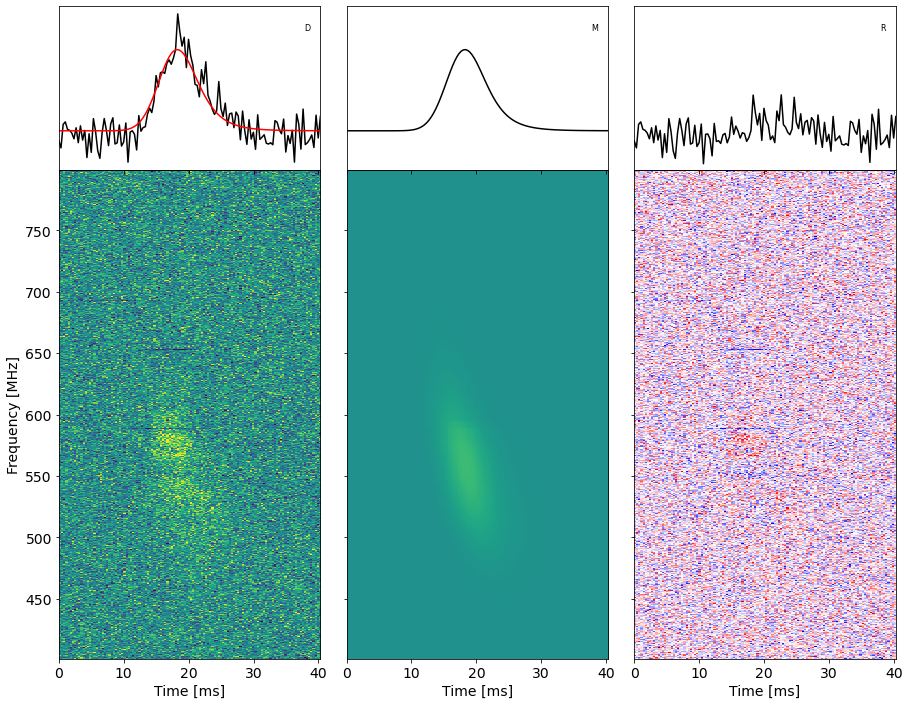

/usr/local/lib/python3.7/site-packages/numpy/lib/npyio.py:719: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  val = np.asanyarray(val)


In [5]:
# event_fail = []
for i in range(1,2):
    #if dsamp_low[i] < 256:
    #clear_output(wait=True)
    print(entries[i])
    print(dsamp_low[i])

    frb_master_base_url = "http://frb-vsop.chime:8001"
    master = frb_master.FRBMaster(base_url = frb_master_base_url)

    event_id = entries[i]

    r = master.events.get_event(event_number=int(event_id))

    burst_time_str = r['measured_parameters'][0]['datetime'][0:19]
    burst_time = dt.datetime.strptime(burst_time_str, "%Y-%m-%d %H:%M:%S")
    print(burst_time)

    year = burst_time.strftime("%Y")
    month = burst_time.strftime("%m")
    day = burst_time.strftime("%d")

    file = '/data/chime/baseband/processed/{}/{}/{}/astro_{}/singlebeam_{}.h5'.format(year, month, day, event_id, event_id)
    gc.collect()
    print(file)

    from baseband_analysis.core import BBData
    print("Loading singelebeam file {}".format(file))
    data = BBData.from_file(file)
    print("File loaded")
    f = os.path.splitext(os.path.basename(file))
    s = '_'.join(f[0].split('_')[1:])

#     if (dsamp_low[i] == 256) and (dsamp_low[i] == 128):
#         dsamp = dsamp_low[i]*2
        
#     elif (dsamp_low[i] < 128):
#         dsamp = dsamp_low[i]*4
        
#     else:
#         dsamp = dsamp_low[i]
    dsamp = dsamp_low[i]*2
    print(dsamp)
    dm = dms_pol[i]
    fit_file = str("R3_"+str(s)+"_DM_"+str(dm)+"_dsamp_"+str(dsamp))


    #try:
    make_input(file, # location of h5 file
               nwalkers=50, # number of walkers for MCMC
               nchain=10000, # length of MCMC chains
               downsample = dsamp, # downsampling factor for peak_finding step
               fit_DM = False,
               DM = dm,
               downsample2 = None,
               fit_spectrum = False,
               # Note: include downsample2 = --- where downsample2 < downsample; downsample2 is the factor for the rest of the analysis while downsample is up to peak finding step
               # where you may wantto downsample more to find peaks more easily.
               # Reference frequency only passed to fitburst!! RPL parameters are always calculated at 600 MHz reference_freq
               # However, fitburst is usually able to adapt and fit correctly even though the RPL parameters are wrt 600 MHz. This can obviously be improved.
               # Bins of start and end of baseband dump at downsampling factor = downsample.
               # DM to coherently de-disperse to
               # Guess of peak positions (without this, lowess is only able to find one peak)
               save = 'pm_R3_dsamp_'+str(dsamp)+'_', # Prefix for saving MCMC results
               diagnostic_plots=True, 
               output = fit_file #prefix for fitburst npz input file
              )
    #     except:
    #         print("Event failed")
    #         event_fail.append(entries[i])

    npz_file = str(fit_file)+".npz"
    run_fitburst(npz_file, "./")
    
#     from datetime import date
#     today = date.today()
#     today = today.strftime("%Y%m%d")
#     folder_name = str(event_id)
#     directory = "/data/user-data/ksand/R3/fitburst_run_pol_dm_2_high_dsamp/"
#     path = os.path.join(directory,str(event_id))

#     try:
#         os.mkdir(path)
#         path = os.path.join(directory,str(event_id),'Trial1_'+str(today))
#         print(path)
#         os.mkdir(path)
#     except:    
#         path = os.path.join(directory,str(event_id),'Trial2_'+str(today))
#         print(path)
#         os.mkdir(path)

#     cmd = "mv -f *.png *.npz *.pdf {}/".format(path)
#     os.system(cmd)
    gc.collect()

[2022-11-03 01:13:53,050] INFO Authorization Status: None
[2022-11-03 01:13:53,051] INFO Authorization Method: Tokens
[2022-11-03 01:13:53,077] INFO Authorization Token : Expired
[2022-11-03 01:13:53,079] INFO Reauthorize Method: Tokens
[2022-11-03 01:13:53,129] WARNING It is required that you pass in a value for the "algorithms" argument when calling decode().
[2022-11-03 01:13:53,130] INFO Reauthorize Result: Passed


2021-12-22 03:43:10
singlebeam_203935225.h5
/data/chime/baseband/processed/2021/12/22/astro_203935225/singlebeam_203935225.h5
Loading singelebeam file /data/chime/baseband/processed/2021/12/22/astro_203935225/singlebeam_203935225.h5
File loaded
4
Since the DM was already provided get_snr() will run with DM Range as None
While running the first get_snr it will use the DM range as None
performing coherent dedispersion
0.0 348.9750061035156 348.9750061035156


/data/user-data/ksand/baseband-analysis/baseband_analysis/core/signal.py:895: RuntimeWarning: Mean of empty slice
  power = np.nanmean(power, -1)


0.0 348.9750061035156 348.9750061035156
Running the first get_snr() at DM  348.901


/data/user-data/ksand/baseband-analysis/baseband_analysis/core/signal.py:112: RuntimeWarning: Mean of empty slice
  if not np.isnan(np.nanmean(power_in[-1], axis=0)).any():
[2022-11-03 01:14:06,236] INFO Applying LTE mask


In the start (868, 72846)
Apply lte mask (868, 72846)
After time range (868, 72846)
Time range (868, 48342)
Inside get weight
After weights (868, 48342)
After downsample (868, 12085)


/data/user-data/ksand/baseband-analysis/baseband_analysis/core/flagging.py:93: RuntimeWarning: Mean of empty slice
  spect = get_spect(np.nanmean(power_beam, axis=-1), thres=thres_mean)
/usr/local/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1671: RuntimeWarning: Degrees of freedom <= 0 for slice.
  keepdims=keepdims)


After RFI clean (868, 12085)
After refine RFI (868, 12085)
Before removing invalid channels (868, 12085)
At the end (801, 12085)


[2022-11-03 01:14:12,234] INFO Applying LTE mask


In the start (868, 72846)
Apply lte mask (868, 72846)
After time range (868, 72846)
Time range (868, 48342)
Inside get weight
After weights (868, 48342)
After downsample (868, 12085)
After RFI clean (868, 12085)
After refine RFI (868, 12085)
After doublecheck_RFI (868, 12085)
Before removing invalid channels (868, 12085)
At the end (788, 12085)
(788, 12085)
Frequencies minimum and maximum 400.390625 799.609375
Valid channels size 868
Frequency size: 788
Frequency id size: minimum and maximum freq id 788 1 1023
From now on the DM_range for get_snr() will be None
DM value before extracting burst at structure maximising 348.901 0 348.901


[2022-11-03 01:14:19,845] INFO Applying LTE mask


In the start (868, 72846)
Apply lte mask (868, 72846)
After time range (868, 72846)
Time range (868, 48342)
Inside get weight
After weights (868, 48342)
After downsample (868, 12085)
After refine RFI (868, 12085)
Before removing invalid channels (868, 12085)
At the end (852, 12085)


[2022-11-03 01:14:24,973] INFO Applying LTE mask


In the start (868, 72846)
Apply lte mask (868, 72846)
After time range (868, 72846)
Time range (868, 48342)
Inside get weight
After weights (868, 48342)
After downsample (868, 12085)
After refine RFI (868, 12085)
After doublecheck_RFI (868, 12085)
Before removing invalid channels (868, 12085)
At the end (794, 12085)


<Figure size 432x288 with 0 Axes>

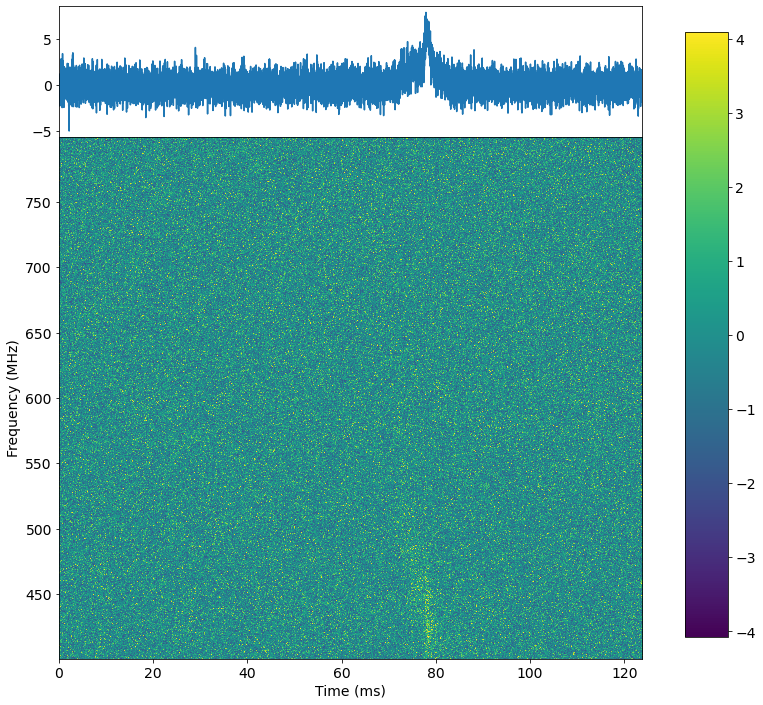

DM value after extracting burst at structure maximising is 348.901 0 348.901
DM value used from now on in downsample 2 is 348.901
[1623 1120  387 1354 2362 2871 2626   69  854  146 2751 2496  951 2183
 2254 1464 2042 1974 2440 2094 1198 1884 1478]
[0.01661952 0.0114688  0.00396288 0.01386496 0.02418688 0.02939904
 0.02689024 0.00070656 0.00874496 0.00149504 0.02817024 0.02555904
 0.00973824 0.02235392 0.02308096 0.01499136 0.02091008 0.02021376
 0.0249856  0.02144256 0.01226752 0.01929216 0.01513472]
[6.1 1.  0.6 0.6 0.4 0.4 0.4 0.3 0.3 0.3 0.3 0.3 0.3 0.3 0.2 0.2 0.1 0.1
 0.1 0.1 0.1 0.1 0.1]
[5.71552105 1.87590025 0.31143188 2.38849987 0.21128437 0.10483213
 0.15667321 0.25672442 0.17533032 0.07881479 0.09291779 0.20172627
 0.15974976 0.17334256 0.13539737 2.12521126 0.45637255 0.75316
 0.01401083 0.2041409  1.08891319 1.03110316 2.12211381]
[1623 1120  387 1354 2362 2871 2626   69  854  146 2751 2496  951 2183
 2254 1464 2042 1974 2440 2094 1198 1884 1478]
[0.01661952 0.0114688  0.0

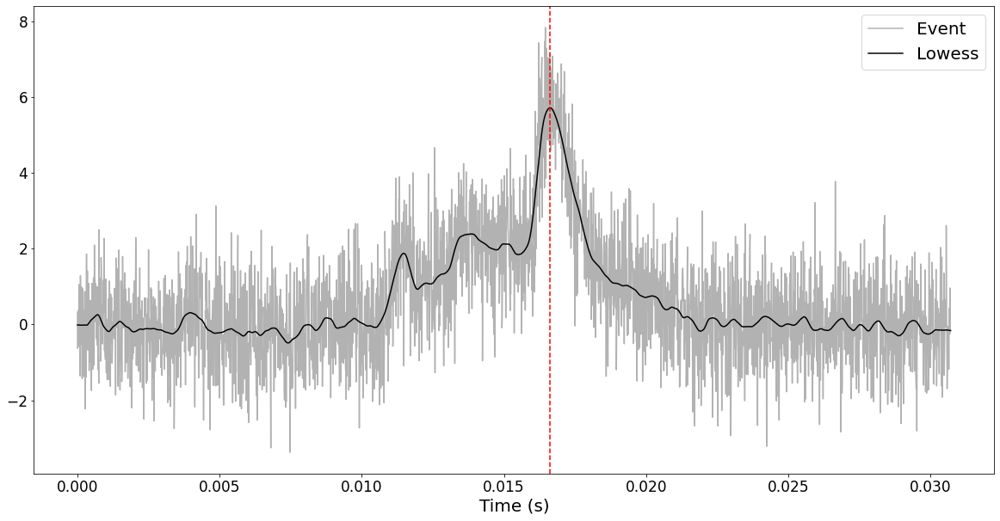

<Figure size 432x288 with 0 Axes>

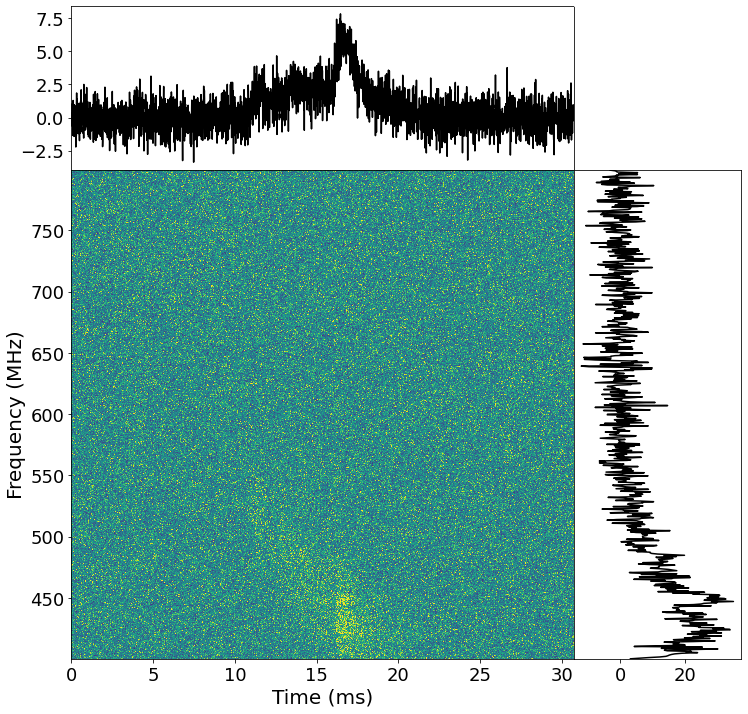

<Figure size 432x288 with 0 Axes>

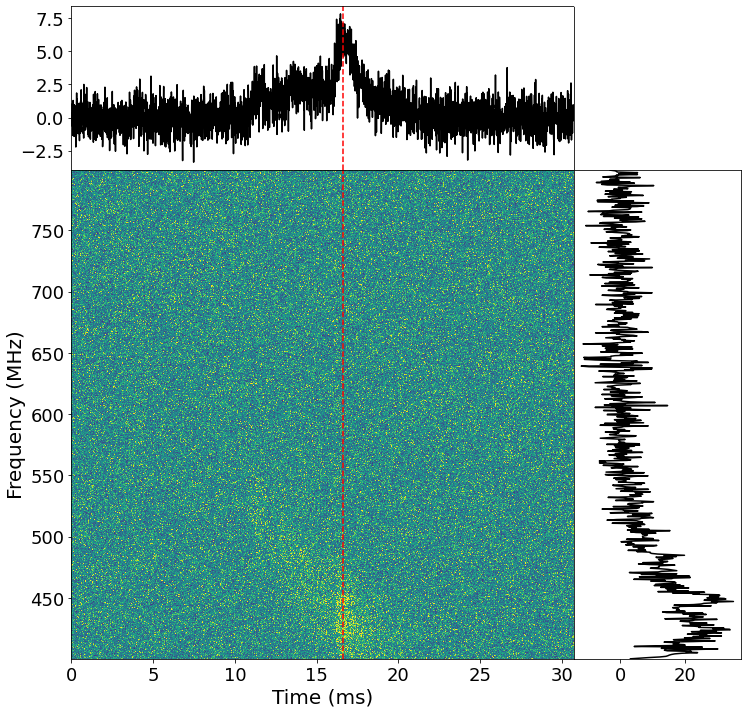

Starting MCMC fit
3  {}
[0.01661952]
[0.0095744]
[0.0095744]
[0, 0.009574399999999999, 0, 0] [0.003050465771484375, 0.01661952, 0.00038912, 0.00077824] [inf, 0.01661952, inf, inf]


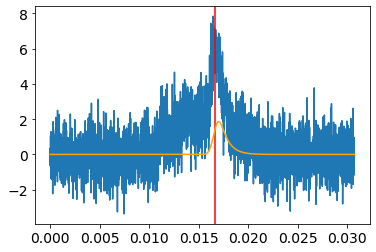

/usr/local/lib/python3.7/site-packages/fitburst/routines/profile.py:214: RuntimeWarning: overflow encountered in exp
  I = lam/2*np.exp(lam/2*(2*mu + lam*sigma**2 - 2*x))
/usr/local/lib/python3.7/site-packages/fitburst/routines/profile.py:214: RuntimeWarning: overflow encountered in multiply
  I = lam/2*np.exp(lam/2*(2*mu + lam*sigma**2 - 2*x))
/usr/local/lib/python3.7/site-packages/fitburst/routines/profile.py:216: RuntimeWarning: invalid value encountered in multiply
  return I * II


Curve_fit params: [1.99550901e-02 1.61177066e-02 2.25644711e-03 7.28703715e-05]
MEAN [0.01611771]
Reduced Chi Squared for Event 203935225 is 1.173


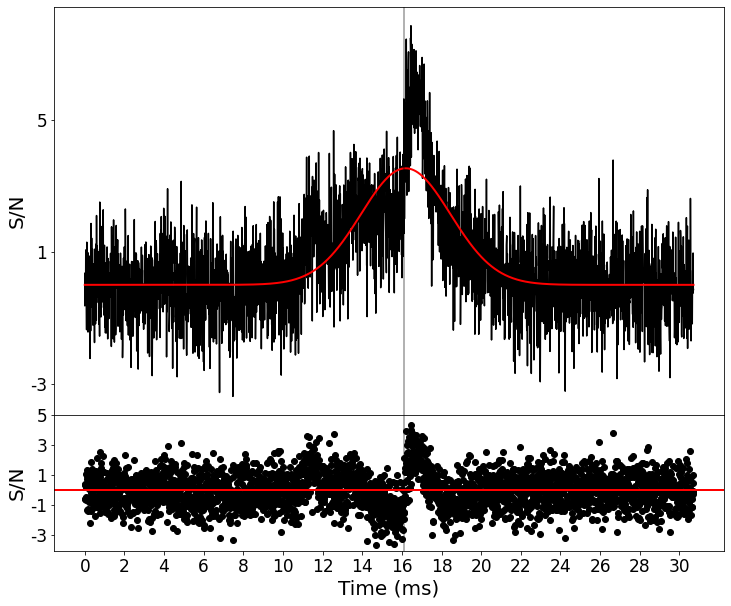

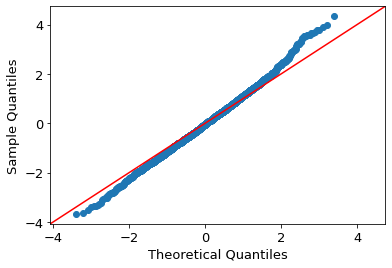

  0%|                                                                                                                      | 10/10000 [00:00<02:04, 80.48it/s]/usr/local/lib/python3.7/site-packages/fitburst/routines/profile.py:214: RuntimeWarning: overflow encountered in multiply
  I = lam/2*np.exp(lam/2*(2*mu + lam*sigma**2 - 2*x))
/usr/local/lib/python3.7/site-packages/fitburst/routines/profile.py:214: RuntimeWarning: overflow encountered in multiply
  I = lam/2*np.exp(lam/2*(2*mu + lam*sigma**2 - 2*x))
/usr/local/lib/python3.7/site-packages/fitburst/routines/profile.py:214: RuntimeWarning: overflow encountered in multiply
  I = lam/2*np.exp(lam/2*(2*mu + lam*sigma**2 - 2*x))
/usr/local/lib/python3.7/site-packages/fitburst/routines/profile.py:216: RuntimeWarning: invalid value encountered in multiply
  return I * II
/usr/local/lib/python3.7/site-packages/fitburst/routines/profile.py:216: RuntimeWarning: invalid value encountered in multiply
  return I * II
/usr/local/lib/python3.7/sit

/usr/local/lib/python3.7/site-packages/fitburst/analysis/mcmc_fitter.py:182: RuntimeWarning: overflow encountered in square
  ret = - np.sum((prof - model(x,parameters))**2)
/usr/local/lib/python3.7/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/usr/local/lib/python3.7/site-packages/fitburst/analysis/mcmc_fitter.py:182: RuntimeWarning: overflow encountered in square
  ret = - np.sum((prof - model(x,parameters))**2)
/usr/local/lib/python3.7/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
  1%|█▌                                                                                                                   | 129/10000 [00:01<02:18, 71.22it/s]/usr/local/lib/python3.7/site-packages/fitburst/routines/profile.py:216: RuntimeWarning: overflow encountered in multiply
  return I * II
  1%|█

[50.99439423 58.12306554 49.07556393 56.86043112]


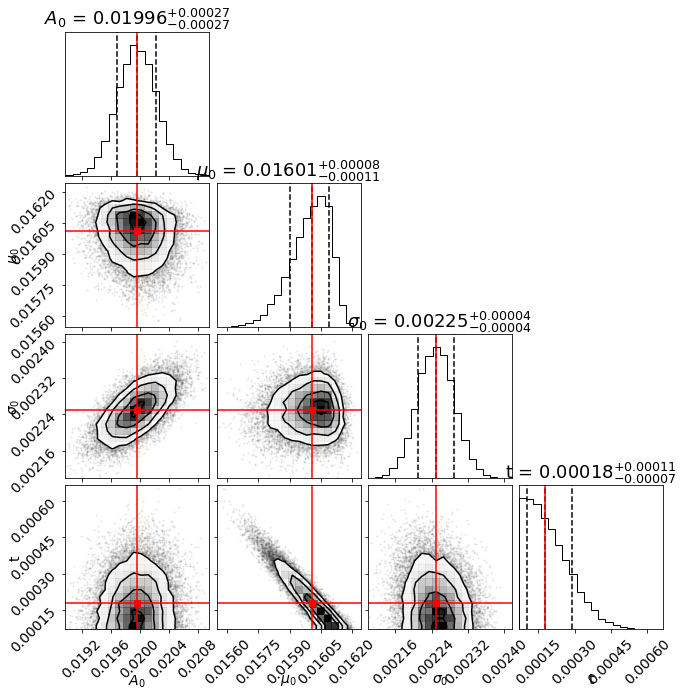

MEAN [0.01601076]
Reduced Chi Squared for Event 203935225 is 1.174


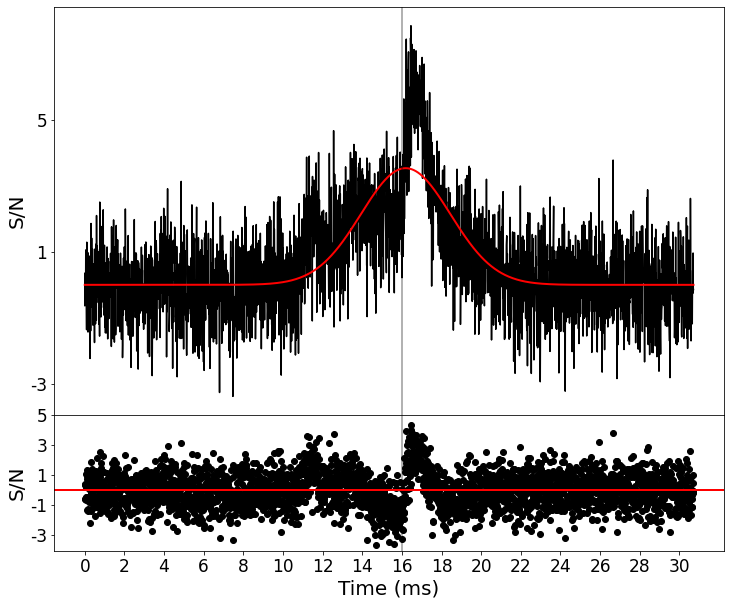

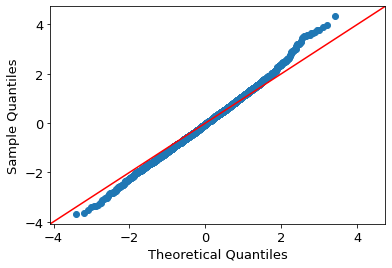

Profile parameters are [0.01996011 0.01601076 0.00224896 0.0001784 ]
The number of peaks provided/found are 1, the best fit occurs with 1 peaks
Spectrum parameters [array([0.]), array([0.]), array([0.])]
Bandwidth is  399.21875
DM error is  0.025


/usr/local/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3441: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/usr/local/lib/python3.7/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
[2022-11-03 01:17:04,129] INFO Initializing model...


Printing frequencies in run fitburst None
Printing good frequencies [0. 1. 1. ... 1. 1. 1.]
Printing frequencies again [400.5859375 400.9765625 401.3671875 ... 799.4140625 799.8046875
 800.1953125]
INFO: input data cube is already dedispersed!
INFO: setting 'dm' entry to 0, now considered a dm-offset parameter...
INFO: computing dedispersion-index matrix
INFO: dimensions of model spectrum set to (1024, 3000)
INFO: removing the following parameters: dm_index, scattering_index
INFO: new list of fit parameters: dm, scattering_timescale, amplitude, arrival_time, burst_width, spectral_index, spectral_running


KeyboardInterrupt: 

In [8]:
##### Running singlebeam files generated by Ryan ######
failed_events = []
for i in range(1,2):
    try:
        frb_master_base_url = "http://frb-vsop.chime:8001"
        master = frb_master.FRBMaster(base_url = frb_master_base_url)
        event_id = events_pola[i]
        clear_output(wait=True)

        r = master.events.get_event(event_number=int(event_id))

        burst_time_str = r['measured_parameters'][0]['datetime'][0:19]
        burst_time = dt.datetime.strptime(burst_time_str, "%Y-%m-%d %H:%M:%S")
        print(burst_time)

        year = burst_time.strftime("%Y")
        month = burst_time.strftime("%m")
        day = burst_time.strftime("%d")

        directory = '/data/chime/baseband/processed/{}/{}/{}/astro_{}'.format(year, month, day, event_id)

        os.chdir(directory)
        for f in glob.glob("singlebeam*.h5"):
            sbeam = f
            print(sbeam)
        file = directory+'/'+str(sbeam)
        print(file)
        from baseband_analysis.core import BBData
        print("Loading singelebeam file {}".format(file))
        data = BBData.from_file(file)
        print("File loaded")


        f = os.path.splitext(os.path.basename(file))
        s = '_'.join(f[0].split('_')[1:])

        dsamp = dsamp_pola[i]
        print(dsamp)
        dm = dms_pola[i]
        fit_file = str("R3_"+str(s)+"_DM_"+str(dm)+"_dsamp_"+str(dsamp))

        make_input(file, 
                   nwalkers=50, 
                   nchain=10000, 
                   downsample = dsamp, 
                   fit_DM = False,
                   DM = dm,
                   downsample2 = None,
                   fit_spectrum = False,
                   save = 'pm_R3_dsamp_'+str(dsamp)+'_',
                   spectrum_lim = False,
                   diagnostic_plots=True, 
                   time_range=[6000,9000],
                   output = fit_file 
                  )
        npz_file = str(fit_file)+".npz"
        run_fitburst(npz_file, "./")

        from datetime import date
        today = date.today()
        today = today.strftime("%Y%m%d")
        folder_name = str(event_id)
        directory = "/data/user-data/ksand/R3/fitburst_run_singlebeam_pol/"
        path = os.path.join(directory,str(event_id))

        try:
            os.mkdir(path)
            path = os.path.join(directory,str(event_id),'Trial1_'+str(today))
            print(path)
            os.mkdir(path)
        except:    
            path = os.path.join(directory,str(event_id),'Trial4_'+str(today))
            print(path)
            os.mkdir(path)

        cmd = "mv -f *.png *.npz *.pdf {}/".format(path)
        os.system(cmd)
    except Exception as e:
        print("Event {} failed".format(event_id))
        print("The error is {}".format(e))
        failed_events.append(event_id)

gc.collect()

In [32]:
print(failed_events)

[40750656, 60073678, 65511496, 83984528, 84081108, 92773515, 92844954, 135577833, 195132396, 203935225]


In [2]:
frb_master_base_url = "http://frb-vsop.chime:8001"
master = frb_master.FRBMaster(base_url = frb_master_base_url)

i = 0

#event_id = 245936178, 246079668,  246077876
event_id =  69841193

r = master.events.get_event(event_number=int(event_id))

burst_time_str = r['measured_parameters'][0]['datetime'][0:19]
burst_time = dt.datetime.strptime(burst_time_str, "%Y-%m-%d %H:%M:%S")
print(burst_time)

year = burst_time.strftime("%Y")
month = burst_time.strftime("%m")
day = burst_time.strftime("%d")

file = '/data/chime/baseband/processed/{}/{}/{}/astro_{}/singlebeam_{}.h5'.format(year, month, day, event_id, event_id)
gc.collect()
print(file)

[2023-01-18 21:38:11,151] INFO Authorization Status: None
[2023-01-18 21:38:11,152] INFO Authorization Method: Tokens
[2023-01-18 21:38:11,200] INFO Authorization Token : Expired
[2023-01-18 21:38:11,201] INFO Reauthorize Method: Tokens
[2023-01-18 21:38:11,281] WARNING It is required that you pass in a value for the "algorithms" argument when calling decode().
[2023-01-18 21:38:11,282] INFO Reauthorize Result: Passed


2020-01-22 10:20:32
/data/chime/baseband/processed/2020/01/22/astro_69841193/singlebeam_69841193.h5


In [3]:
from baseband_analysis.core import BBData
#event_id = 195718715
#event_id = 65395717
#file = '/data/chime/baseband/processed/2019/06/05/astro_40750656/Trial2_20220320/singlebeam_40750656.h5'
#file = '/data/chime/baseband/processed/2019/12/18/astro_{}/Trial1_Ryan/singlebeam_{}.h5'.format(event_id, event_id)
#file = '/data/user-data/ksand/R3/singlebeam_files/singlebeam_{}.h5'.format(event_id)
print("Loading singelebeam file {}".format(file))
data = BBData.from_file(file)
print("File loaded")
#DM = data['tiedbeam_power'].attrs['DM_coherent']
f = os.path.splitext(os.path.basename(file))
s = '_'.join(f[0].split('_')[1:])

Loading singelebeam file /data/chime/baseband/processed/2020/01/22/astro_69841193/singlebeam_69841193.h5


[2023-01-18 21:39:42,836] WARNING The beamformed baseband data is not properly formatted, it will be conjugated for compatibility


File loaded


In [6]:
dsamp = 8
#DM = 348.732
fit_file = str("R4_"+str(s)+"_dsamp_"+str(dsamp))

[2023-01-18 21:49:03,266] WARNING The beamformed baseband data is not properly formatted, it will be conjugated for compatibility


While running the first get_snr it will use the DM range as 5
Tiedbeam baseband dm is 101.9023132324
Data is already de-smeared
performing coherent dedispersion
0.0 101.9023132324 101.9023132324


/data/user-data/ksand/baseband-analysis/baseband_analysis/core/signal.py:902: RuntimeWarning: Mean of empty slice
  power = np.nanmean(power, -1)


0.0 101.9023132324 101.9023132324
Running the first get_snr() at DM  None


/data/user-data/ksand/baseband-analysis/baseband_analysis/core/signal.py:119: RuntimeWarning: Mean of empty slice
  if not np.isnan(np.nanmean(power_in[-1], axis=0)).any():
[2023-01-18 21:49:32,406] INFO Applying LTE mask


In the start (988, 125075)
Apply lte mask (988, 125075)
After time range (988, 125075)
Time range (988, 63053)
Inside get weight
After weights (988, 63053)
After downsample (988, 7881)


/data/user-data/ksand/baseband-analysis/baseband_analysis/core/flagging.py:93: RuntimeWarning: Mean of empty slice
  spect = get_spect(np.nanmean(power_beam, axis=-1), thres=thres_mean)
/usr/local/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1671: RuntimeWarning: Degrees of freedom <= 0 for slice.
  keepdims=keepdims)


After RFI clean (988, 7881)
After refine RFI (988, 7881)
Before removing invalid channels (988, 7881)
At the end (796, 7881)


[2023-01-18 21:49:56,280] INFO Best DM found at 103.55612079248444 pc/cc
[2023-01-18 21:50:00,677] INFO Applying LTE mask


In the start (988, 125075)
Apply lte mask (988, 125075)
After time range (988, 125075)
Time range (988, 63053)
Inside get weight
After weights (988, 63053)
After downsample (988, 7881)
After RFI clean (988, 7881)
After refine RFI (988, 7881)
Before removing invalid channels (988, 7881)
At the end (829, 7881)


[2023-01-18 21:50:13,904] INFO Applying LTE mask


In the start (988, 125075)
Apply lte mask (988, 125075)
After time range (988, 125075)
Time range (988, 63053)
Inside get weight
After weights (988, 63053)
After downsample (988, 7881)
After RFI clean (988, 7881)
After refine RFI (988, 7881)
After doublecheck_RFI (988, 7881)
Before removing invalid channels (988, 7881)
At the end (827, 7881)


[2023-01-18 21:50:23,110] WARNING Pulse not centered, noise will be added to search the full dump.
[2023-01-18 21:50:27,481] INFO Applying LTE mask


In the start (988, 125075)
Apply lte mask (988, 125075)
Time range (988, 125075)
Inside get weight
After weights (988, 125075)
After downsample (988, 15634)
After RFI clean (988, 15634)
After refine RFI (988, 15634)
Before removing invalid channels (988, 15634)
At the end (884, 15634)


[2023-01-18 21:51:06,470] INFO Best DM found at 103.68186841650576 pc/cc
[2023-01-18 21:51:10,383] INFO Applying LTE mask


In the start (988, 125075)
Apply lte mask (988, 125075)
Time range (988, 125075)
Inside get weight
After weights (988, 125075)
After downsample (988, 15634)
After RFI clean (988, 15634)
After refine RFI (988, 15634)
Before removing invalid channels (988, 15634)
At the end (884, 15634)


[2023-01-18 21:51:30,430] INFO Applying LTE mask


In the start (988, 125075)
Apply lte mask (988, 125075)
Time range (988, 125075)
Inside get weight
After weights (988, 125075)
After downsample (988, 15634)
After RFI clean (988, 15634)
After refine RFI (988, 15634)
After doublecheck_RFI (988, 15634)
Before removing invalid channels (988, 15634)
At the end (883, 15634)
(883, 4528)
Frequencies minimum and maximum 412.109375 800.0
Valid channels size 988
Frequency size: 883
Frequency id size: minimum and maximum freq id 883 0 993
From now on the DM_range for get_snr() will be None
APPLIED2
APPLIED1
APPLIED2
DM value before extracting burst at structure maximising 103.68186841650576 0 103.68186841650576


[2023-01-18 21:51:52,613] INFO Applying LTE mask


In the start (988, 125075)
Apply lte mask (988, 125075)
After time range (988, 125075)
Time range (988, 63053)
Inside get weight
After weights (988, 63053)
After downsample (988, 7881)
After refine RFI (988, 7881)
Before removing invalid channels (988, 7881)
At the end (913, 7881)


[2023-01-18 21:52:04,195] INFO Applying LTE mask


In the start (988, 125075)
Apply lte mask (988, 125075)
After time range (988, 125075)
Time range (988, 63053)
Inside get weight
After weights (988, 63053)
After downsample (988, 7881)
After refine RFI (988, 7881)
After doublecheck_RFI (988, 7881)
Before removing invalid channels (988, 7881)
At the end (836, 7881)


[2023-01-18 21:52:12,211] WARNING Pulse not centered, noise will be added to search the full dump.
[2023-01-18 21:52:16,900] INFO Applying LTE mask


In the start (988, 125075)
Apply lte mask (988, 125075)
Time range (988, 125075)
Inside get weight
After weights (988, 125075)
After downsample (988, 15634)
After refine RFI (988, 15634)
Before removing invalid channels (988, 15634)
At the end (913, 15634)


[2023-01-18 21:52:33,920] INFO Applying LTE mask


In the start (988, 125075)
Apply lte mask (988, 125075)
Time range (988, 125075)
Inside get weight
After weights (988, 125075)
After downsample (988, 15634)
After refine RFI (988, 15634)
After doublecheck_RFI (988, 15634)
Before removing invalid channels (988, 15634)
At the end (883, 15634)


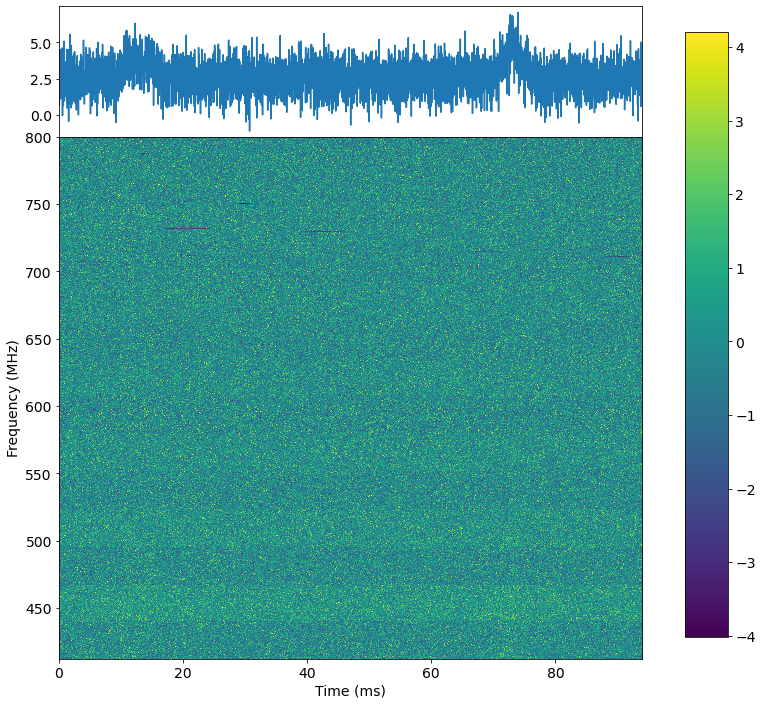

DM value after extracting burst at structure maximising is 103.68186841650576 0 103.68186841650576
DM value used from now on in downsample 2 is 103.68186841650576
APPLIED2
APPLIED1
APPLIED2
[3565  721 4501 2865 4104  315 1948 1214  411 2344 3189 4402 1336 2195
  544 3350 2605 2967 1014 2456  612 2718 1626 1507   99  230 4337  875
 2050 1397 3032 4224 1138 1842  946 3996 3851 3915 2140 1741 1796 3781
 3723 3886 1974 1239 1443  189 2809 4543 3655 2538 4523 2479 3099 3969
 2104 1888 1675 2274 2156 4301 3836 3157 1577  177  700 1648 2825 2992]
[0.0730112  0.01476608 0.09218048 0.0586752  0.08404992 0.0064512
 0.03989504 0.02486272 0.00841728 0.04800512 0.06531072 0.09015296
 0.02736128 0.0449536  0.01114112 0.068608   0.0533504  0.06076416
 0.02076672 0.05029888 0.01253376 0.05566464 0.03330048 0.03086336
 0.00202752 0.0047104  0.08882176 0.01792    0.041984   0.02861056
 0.06209536 0.08650752 0.02330624 0.03772416 0.01937408 0.08183808
 0.07886848 0.0801792  0.0438272  0.03565568 0.036782

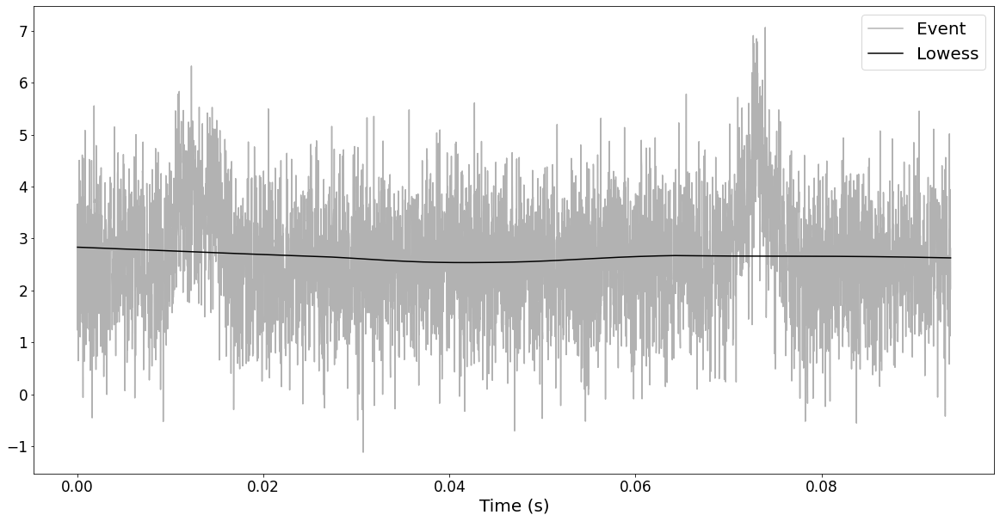

<Figure size 432x288 with 0 Axes>

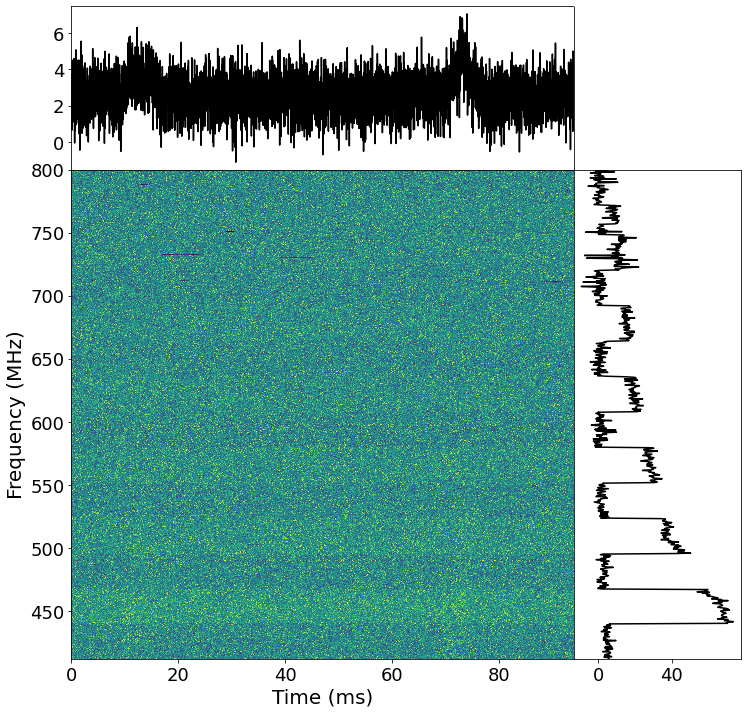

<Figure size 432x288 with 0 Axes>

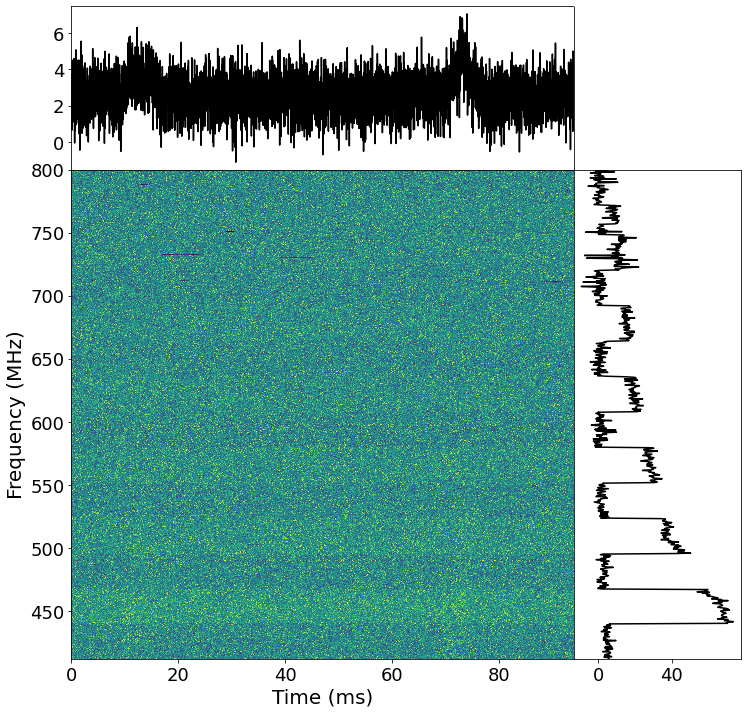

Starting MCMC fit
3  {}
[]
[]
[]


UnboundLocalError: local variable 'sigma_guess' referenced before assignment

In [7]:
make_input(file, # location of h5 file
           nwalkers=50, # number of walkers for MCMC
           nchain=10000, # length of MCMC chains
           downsample = dsamp, # downsampling factor for peak_finding step
           fit_DM = False,
           downsample2 = None,
           fit_spectrum = False,
           #DM = DM,
           spectrum_lim = False,
           #fill_missing_time = True,
           #peaks = [36, 74],
           # Note: include downsample2 = --- where downsample2 < downsample; downsample2 is the factor for the rest of the analysis while downsample is up to peak finding step
           # where you may wantto downsample more to find peaks more easily.
           # Reference frequency only passed to fitburst!! RPL parameters are always calculated at 600 MHz reference_freq
           # However, fitburst is usually able to adapt and fit correctly even though the RPL parameters are wrt 600 MHz. This can obviously be improved.
           # Bins of start and end of baseband dump at downsampling factor = downsample.
           # DM to coherently de-disperse to
           # Guess of peak positions (without this, lowess is only able to find one peak)
           save = 'pm_R4_dsamp_'+str(dsamp)+'_', # Prefix for saving MCMC results
           diagnostic_plots=True, 
           output = fit_file #prefix for fitburst npz input file
          )



In [28]:
gc.collect()

154497

[2022-12-12 21:58:18,023] INFO Initializing model...


Printing frequencies in run fitburst None
Printing good frequencies [0. 1. 0. ... 1. 1. 0.]
Printing frequencies again [400.9765625 401.3671875 401.7578125 ... 799.8046875 800.1953125
 800.5859375]
INFO: input data cube is already dedispersed!
INFO: setting 'dm' entry to 0, now considered a dm-offset parameter...
INFO: computing dedispersion-index matrix
INFO: dimensions of model spectrum set to (1024, 320)
fixing dm-offset
INFO: removing the following parameters: dm_index, scattering_index, dm
INFO: new list of fit parameters: scattering_timescale, amplitude, arrival_time, burst_width, spectral_index, spectral_running
INFO: fit successful!
INFO: derived uncertainties from Jacobian data
Best-fit uncertaintes: {'scattering_timescale': [3.327272331299015e-05], 'amplitude': array([0.30712571, 0.54788478]), 'arrival_time': array([1.64878995e-05, 4.17593342e-05]), 'burst_width': array([2.22805275e-05, 6.26055789e-05]), 'spectral_index': array([5.28913039, 8.10323711]), 'spectral_running': a

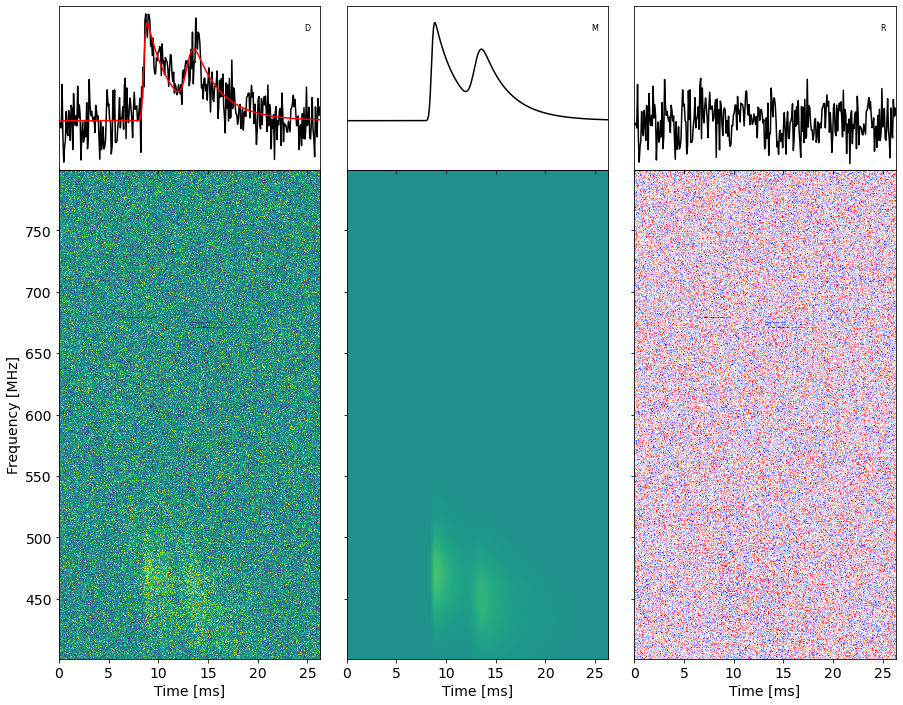

/usr/local/lib/python3.7/site-packages/numpy/lib/npyio.py:719: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  val = np.asanyarray(val)


In [29]:
npz_file = str(fit_file)+".npz"
# nt = np.logspace(2,4.2,10).astype(int)
# for i in range(len(nt)):
#     npz_file = "{}_downsamp_simulation.npz".format(nt[i])
#     run_fitburst(npz_file, '/data/user-data/ksand/R3/sims/')
#     gc.collect()
run_fitburst(npz_file, './')
#run_fitburst("fitburst_209838881.npz", "./")

In [81]:
from datetime import date
today = date.today()
today = today.strftime("%Y%m%d")
folder_name = str(event_id)
directory = "/data/user-data/ksand/R3/fitburst_run_fixed_DM/"
path = os.path.join(directory,str(event_id))

try:
    os.mkdir(path)
    path = os.path.join(directory,str(event_id),'Trial1_'+str(today))
    print(path)
    os.mkdir(path)
except:    
    path = os.path.join(directory,str(event_id),'Trial2_'+str(today))
    print(path)
    os.mkdir(path)

cmd = "mv -f *.png *.npz *.pdf {}/".format(path)
os.system(cmd)

/data/user-data/ksand/R3/fitburst_run_fixed_DM/71665813/Trial1_20221212


mv: cannot stat '*.pdf': No such file or directory


256

In [21]:
from datetime import date
today = date.today()
today = today.strftime("%Y%m%d")
folder_name = str(event_id)
directory = "/data/user-data/ksand/R3/fitburst_run_pol_DM_2/"
path = os.path.join(directory,str(event_id))

try:
    os.mkdir(path)
    path = os.path.join(directory,str(event_id),'Trial1_'+str(today))
    print(path)
    os.mkdir(path)
except:    
    path = os.path.join(directory,str(event_id),'Trial2_'+str(today))
    print(path)
    os.mkdir(path)

cmd = "mv -f *.png *.npz *.pdf {}/".format(path)
os.system(cmd)

/data/user-data/ksand/R3/fitburst_run_pol_DM_2/203935225/Trial2_20220718


mv: cannot stat '*.pdf': No such file or directory


256

In [10]:
min(3,3)

3

In [7]:
# npz_file = str(fit_file)+".npz"
# cmd = 'python /fitburst/fitburst/pipelines/fitburst_example_generic.py {} --verbose --variance_range 0. 1. --show True'.format(npz_file)
# #cmd = 'python /fitburst/fitburst/pipelines/fitburst_example_generic.py {} --verbose --variance_range 0. 1. --show True --width 0.00022 --amplitude 1.0 --downsample_freq 4'.format(npz_file)
# print(cmd)
# os.system(cmd)

ModuleNotFoundError: No module named 'frb_dq_utils'

In [55]:
##### Events to run manually ####
failed_events = np.array(failed_events)
event_to_run = np.sort(np.concatenate((failed_events, event_remove)))
print(event_to_run)

[ 23891929  40750656  60073678  65511496  67522901  83984528  84081108
  92773515  92844954 135577833 171855709 180667327 188553320 194488374
 195132396 200973875 203798724 203935225 203935225]


In [54]:
event_to_run = np.unique(np.sort(np.append(event_to_run, [[71784400, 154913824]])))
print(event_to_run)

[ 23891929  40750656  60073678  65511496  67522901  71784400  83984528
  84081108  92773515  92844954 135577833 154913824 171855709 180667327
 188553320 194488374 195132396 200973875 203798724 203935225]


In [1]:
basepath = '/data/user-data/ksand/R3/fitburst_run_singlebeam_pol/'
entries = os.listdir(basepath)
entries.remove('.ipynb_checkpoints')
entries = np.array(entries)
entries = entries.astype(int)
entries = np.sort(entries)
print(entries)
print(entries.shape)

NameError: name 'os' is not defined

In [6]:
no_fitburst_event = np.setdiff1d(events_pola, entries)
print(no_fitburst_event)

[ 23891929  40750656  60073678  65511496  67522901  84081108 135577833
 171855709 180667327 188553320 194488374 195132396 200973875 203798724
 203935225]


In [4]:
events_to_re_run = [40750656]
print(events_to_re_run)


[40750656, 60073678, 65511496, 135577833, 154913824, 163534005, 166812476, 176060009, 180666196, 194488374, 194488393, 195132396, 203798724, 40363753, 71784400, 83984528, 92844954]


In [7]:
!ls /data/chime/baseband/processed/2018/12/26/astro_23891929/

ls: cannot access '/data/chime/baseband/processed/2018/12/26/astro_23891929/': No such file or directory


In [2]:
#### Running intensity files ####



npz_file = 'test_data_CHIMEFRB_155079679.npz'
# data = np.load(npz_file, allow_pickle=True)
# for k in data.items():
#     print(k)

# nt = np.logspace(2,4.2,10).astype(int)
# for i in range(len(nt)):
#     npz_file = "{}_downsamp_simulation.npz".format(nt[i])
#     run_fitburst(npz_file, '/data/user-data/ksand/R3/sims/')
#     gc.collect()
run_fitburst(npz_file, '/data/user-data/ksand/R3/R3_intensity_fitburst_run/')
#run_fitburst("fitburst_209838881.npz", "./")

[2022-12-12 21:15:16,098] INFO Initializing model...


Printing frequencies in run fitburst None
Printing good frequencies [1. 1. 1. ... 1. 1. 1.]
Printing frequencies again [400.23193359 400.25634766 400.28076172 ... 800.15869141 800.18310547
 800.20751953]
INFO: input data cube is already dedispersed!
INFO: setting 'dm' entry to 0, now considered a dm-offset parameter...
INFO: computing dedispersion-index matrix
INFO: dimensions of model spectrum set to (16384, 162)


/usr/local/lib/python3.7/site-packages/fitburst/pipelines/run_fitburst.py:74: RuntimeWarning: invalid value encountered in log10
  model.update_parameters({"amplitude": [np.log10(np.mean(data_windowed))] * num_components})


fixing dm-offset
INFO: removing the following parameters: dm_index, scattering_index, dm
INFO: new list of fit parameters: scattering_timescale, amplitude, arrival_time, burst_width, spectral_index, spectral_running
ERROR: solver encountered a failure! Debug!
`x0` is infeasible.
ERROR: could not compute uncertainties!
local variable 'results' referenced before assignment


AttributeError: 'LSFitter' object has no attribute 'bestfit_results'